# Laboratory 5: Image Filtering

# Linear Filtering

In [10]:
import cv2
import sys

img = cv2.imread("Images/pout.tif" )

if img is None:
    sys.exit("Could not read the image.")

In [11]:
import matplotlib.pyplot as plt
import numpy as np

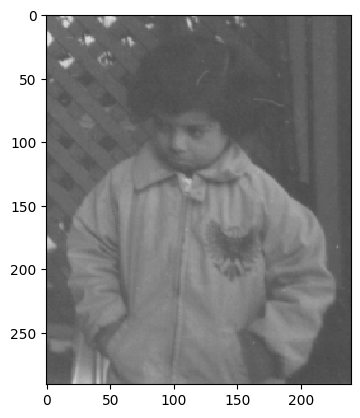

In [12]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Convolution

### Create your own convolution filters:

In [13]:
img_gray = cv2.imread('Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

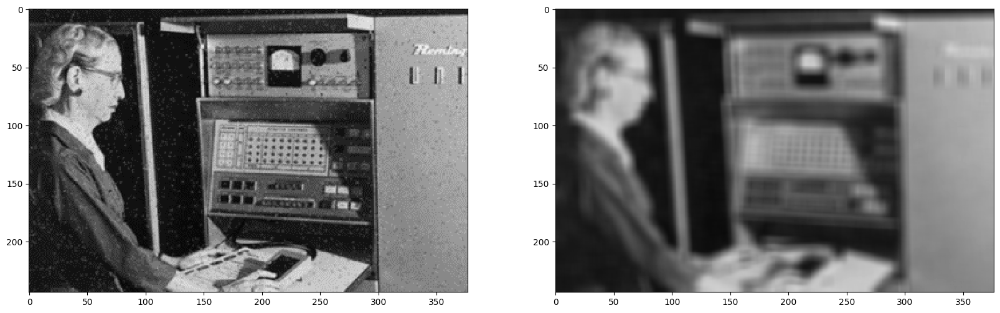

In [14]:
# Create your own filter
kernel_size = 10

# Add you code here for creating a kernel matrix
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel /= (kernel_size * kernel_size)

img_filtered = cv2.filter2D(img_gray, -1, kernel, cv2.BORDER_DEFAULT)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_filtered, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

Check out the flags for border settings here:
https://docs.opencv.org/3.4/d2/de8/group__core__array.html#ga209f2f4869e304c82d07739337eae7c5

## Blur filters (Low pass filters)

### Box filter

In [15]:
img_gray = cv2.imread('Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

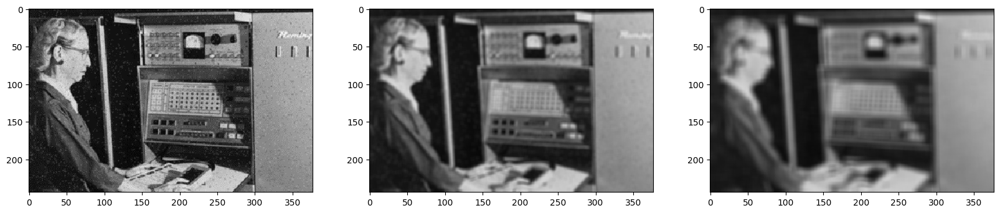

In [16]:
# Box filter
img_blur_box1 = cv2.blur(img_gray,(5,5))
img_blur_box2 = cv2.blur(img_gray,(10,10))


# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_box1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_box2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Gaussian filter

In [17]:
img_gray = cv2.imread('Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

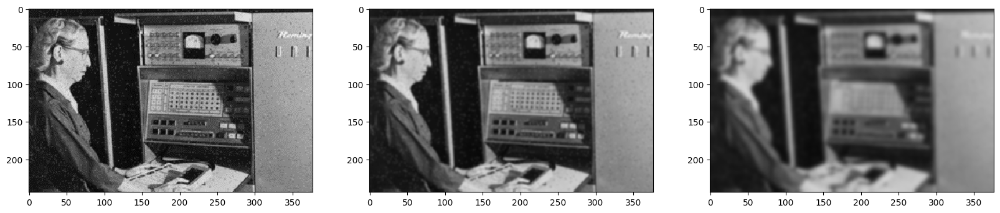

In [18]:
#gaussian filter
img_blur_gauss1 = cv2.GaussianBlur(img_gray, (5,5), 0) 
img_blur_gauss2 = cv2.GaussianBlur(img_gray, (15,15), 0) 

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_gauss1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_gauss2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Edge detection

### Sobel operators

In [19]:
img_gray = cv2.imread('Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

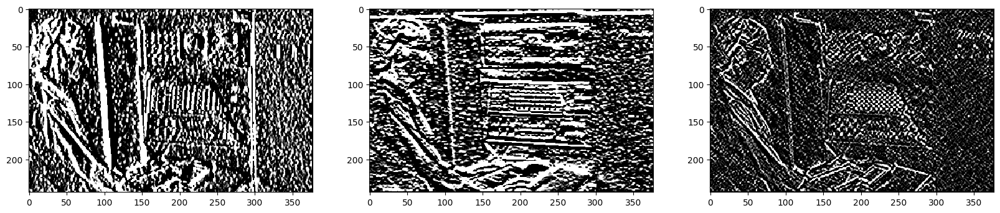

In [20]:
# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_gray, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(sobelx, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(sobely, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(sobelxy, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Canny edge detector

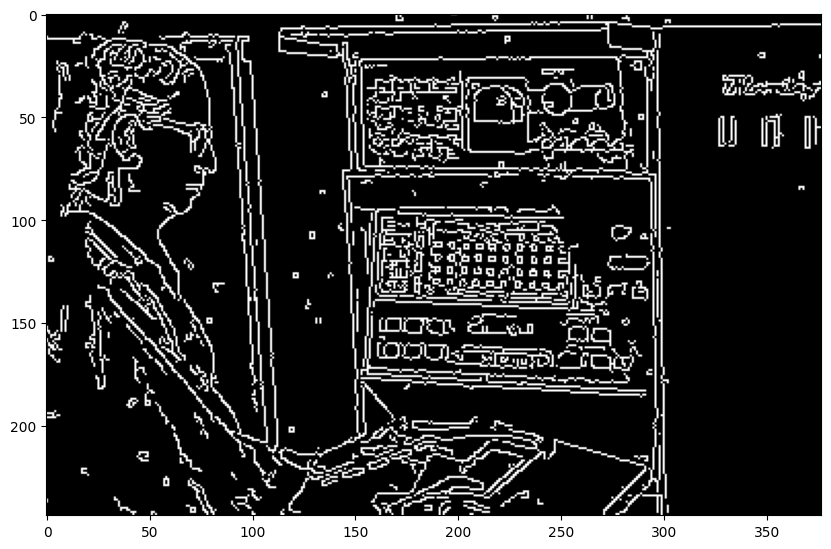

In [21]:
# Canny Edge Detection
canny_edges = cv2.Canny(image=img_gray, threshold1=100, threshold2=200) # Canny Edge Detection

# display the image
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.imshow(cv2.cvtColor(canny_edges, cv2.COLOR_BGR2RGB))
plt.show()

### Sharpening (Unsharp masking)

In [22]:
img_gray = cv2.imread('Images/pout.tif', cv2.IMREAD_GRAYSCALE)

In [23]:
img_blur_gauss = cv2.GaussianBlur(img_gray, (5,5), 0) 

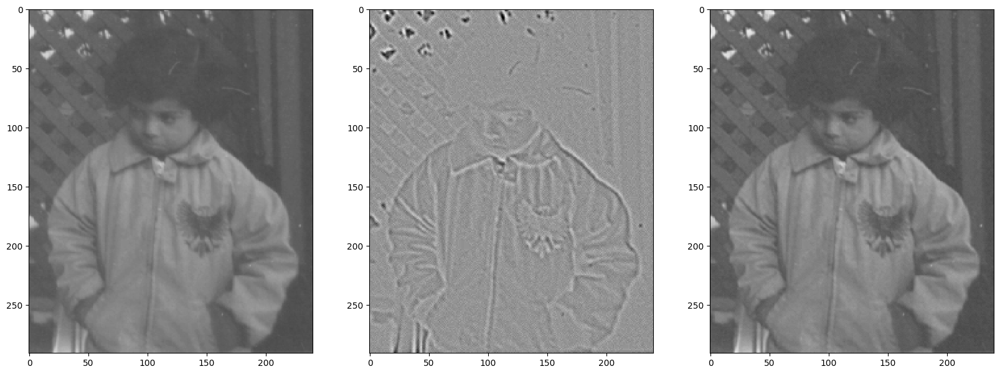

In [24]:
gamma = 0.7

lap = cv2.Laplacian(img_blur_gauss, cv2.CV_64F)

img_sharp = img_gray - gamma*lap 

# display the images
lap_show = np.zeros(lap.shape)
cv2.normalize(lap, lap_show, 0, 255, cv2.NORM_MINMAX)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(lap_show, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_sharp, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Non-linear filters

## Median filter

In [25]:
img_gray = cv2.imread('Images/comp_noise.png', cv2.IMREAD_GRAYSCALE)

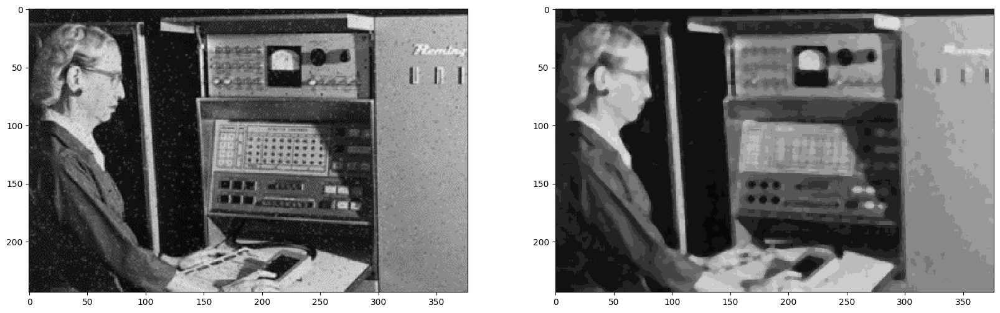

In [26]:
# Median filter
img_gray_median = cv2.medianBlur(img_gray,5)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_gray_median, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Morphological operation

### Dilation & Erosion

In [27]:
img_gray = cv2.imread('Images/text.png', cv2.IMREAD_GRAYSCALE)

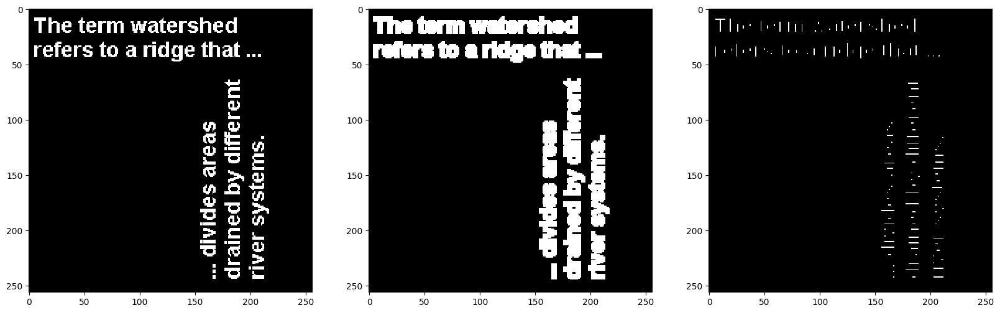

In [28]:
kernel = np.ones((3,3),np.uint8)
dilate = cv2.dilate(img_gray, kernel,iterations = 1)
erode = cv2.erode(img_gray, kernel,iterations = 1)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(dilate, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(erode, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Openning

In [29]:
img_gray = cv2.imread('Images/snowflakes.png', cv2.IMREAD_GRAYSCALE)

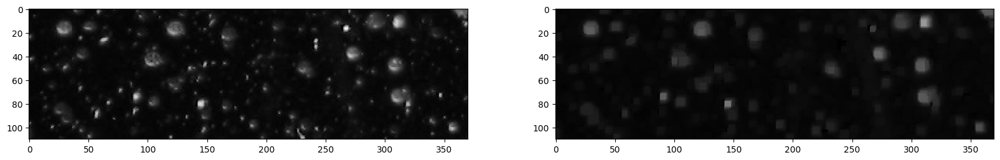

In [30]:
kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(img_gray, cv2.MORPH_OPEN, kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(opening, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Closing

In [31]:
img_gray = cv2.imread('Images/circles.png', cv2.IMREAD_GRAYSCALE)

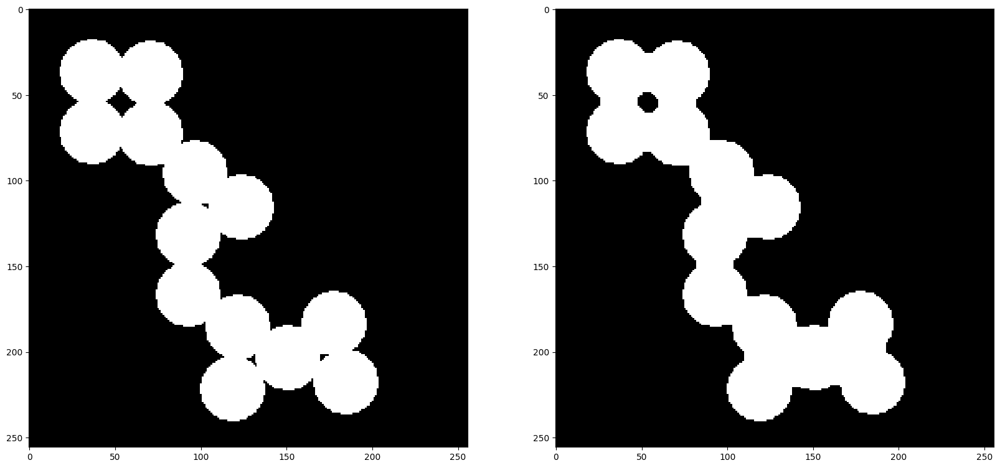

In [32]:
kernel = np.ones((5,5),np.uint8)
closing = cv2.morphologyEx(img_gray, cv2.MORPH_CLOSE, kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(closing, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Assignment 1: Try this tutorial with color image

In [33]:
# Assignment 1: Try this tutorial with color image

In [34]:
img_RGB = cv2.imread('Images/lenna.png', cv2.COLOR_BGR2RGB)

### Gaussian filter

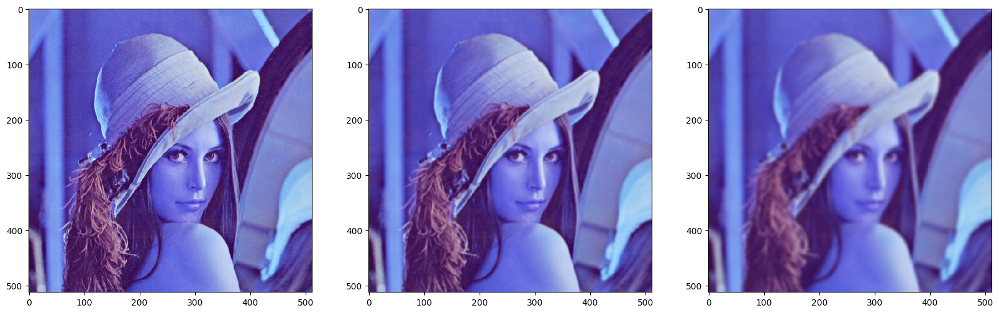

In [35]:

#gaussian filter
img_blur_gauss1 = cv2.GaussianBlur(img_RGB, (5,5), 0) 
img_blur_gauss2 = cv2.GaussianBlur(img_RGB, (15,15), 0) 

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_gauss1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_gauss2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Box filter

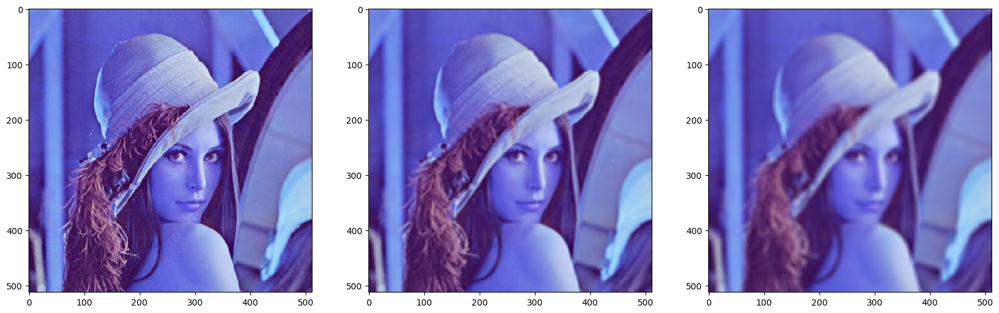

In [36]:


# Box filter
img_blur_box1 = cv2.blur(img_RGB,(5,5))
img_blur_box2 = cv2.blur(img_RGB,(10,10))


# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_blur_box1, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_blur_box2, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Openning

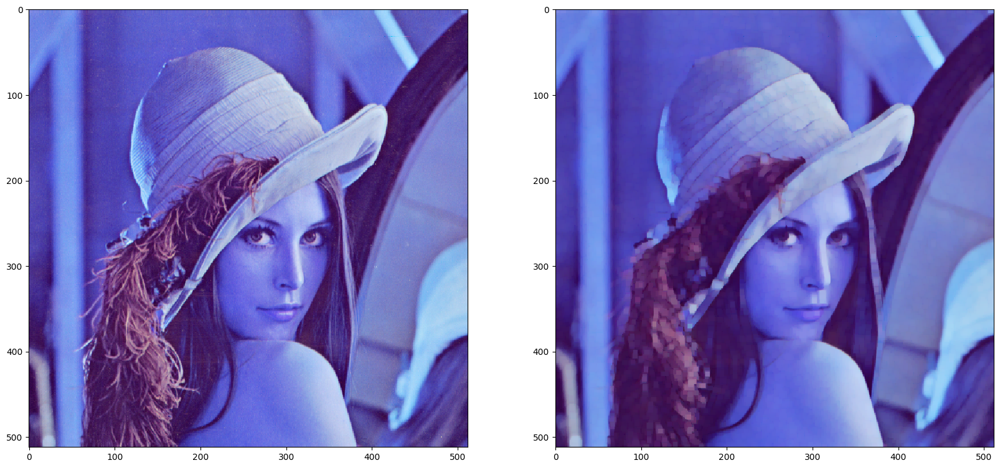

In [37]:



kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(img_RGB, cv2.MORPH_OPEN, kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(opening, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Closing

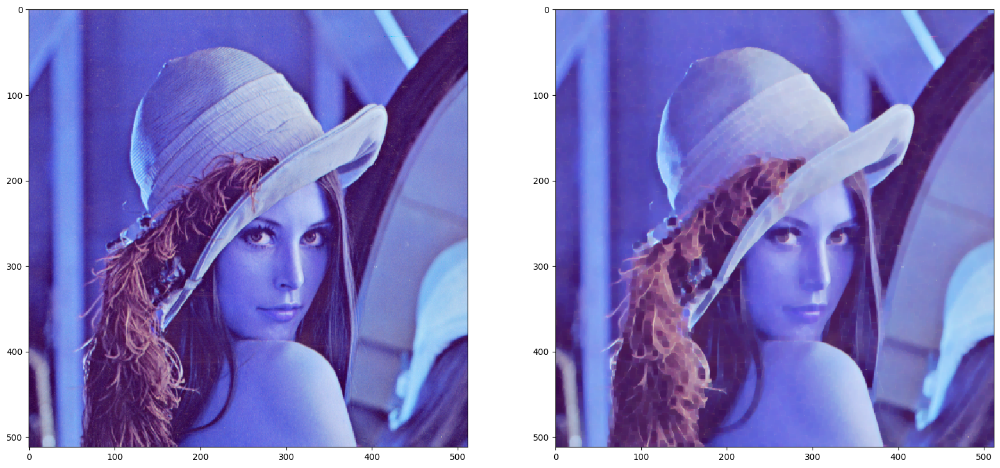

In [38]:


kernel = np.ones((5,5),np.uint8)
closing = cv2.morphologyEx(img_RGB, cv2.MORPH_CLOSE, kernel)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(closing, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Sobel operators

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


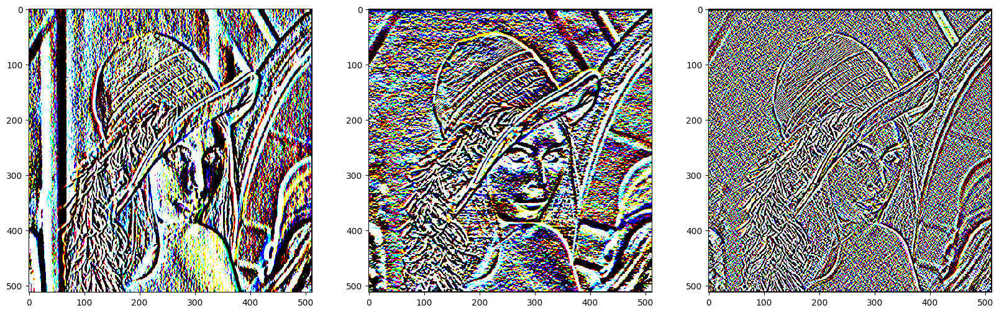

In [39]:


# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_RGB, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_RGB, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_RGB, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(sobelx, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(sobely, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(sobelxy, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Canny edge detector

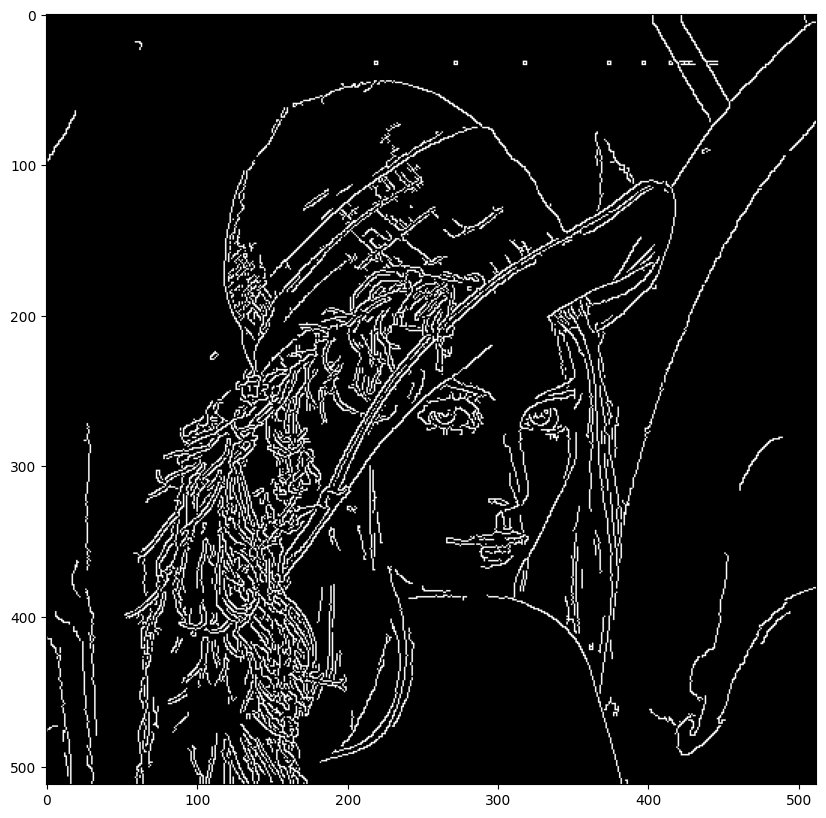

In [40]:



# Canny Edge Detection
canny_edges = cv2.Canny(image=img_RGB, threshold1=100, threshold2=200) # Canny Edge Detection

# display the image
fig = plt.subplots(1, 1, figsize=(10, 10))
plt.imshow(cv2.cvtColor(canny_edges, cv2.COLOR_BGR2RGB))
plt.show()

### Sharpening (Unsharp masking)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


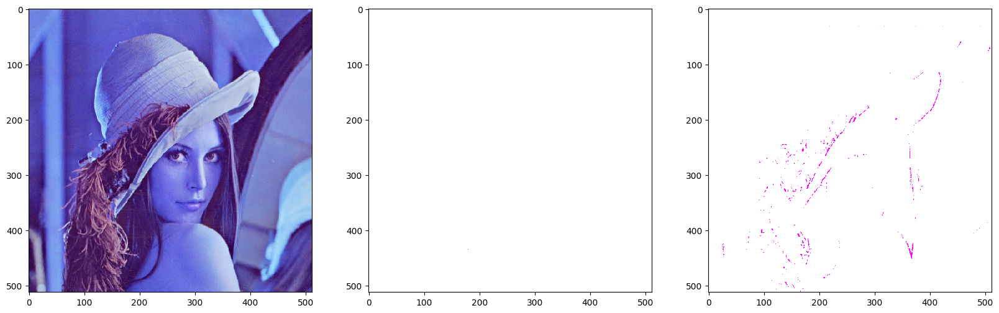

In [41]:
img_blur_gauss = cv2.GaussianBlur(img_RGB, (5,5), 0) 

gamma = 0.7

lap = cv2.Laplacian(img_blur_gauss, cv2.CV_64F)

img_sharp = img_RGB - gamma*lap 

# display the images
lap_show = np.zeros(lap.shape)
cv2.normalize(lap, lap_show, 0, 255, cv2.NORM_MINMAX)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(lap_show, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(img_sharp, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Median filter

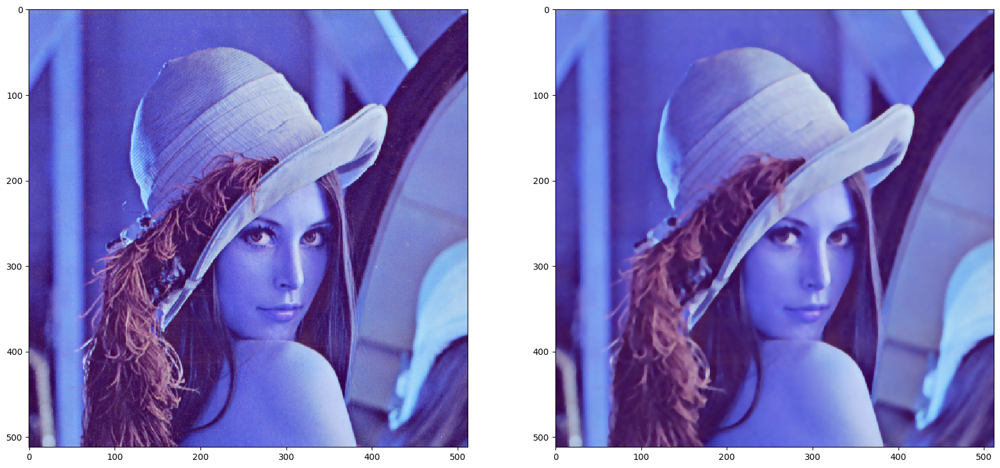

In [42]:
# Median filter
img_RGB_median = cv2.medianBlur(img_RGB,5)

# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(img_RGB_median, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

### Dilation & Erosion

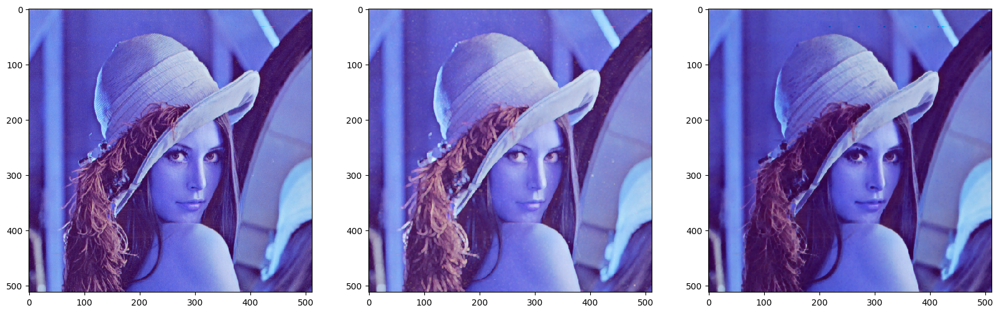

In [43]:
kernel = np.ones((3,3),np.uint8)
dilate = cv2.dilate(img_RGB, kernel,iterations = 1)
erode = cv2.erode(img_RGB, kernel,iterations = 1)

# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_RGB, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(dilate, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(erode, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

# Assignment 2: Counting the blood cells

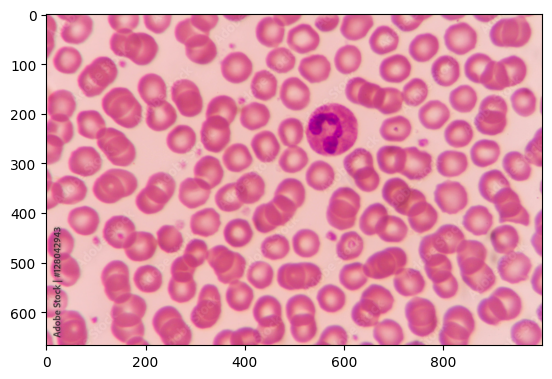

In [46]:
# Assignment 2: Counting the blood cells
# First, you will perform the thresholding to segment the blood cells as binary image
# Most of the time this segment is not perfect. You will have holes, islands, or unessesary segmentation 
# Use cv2.findContours to get a bounding box around all detected contours. 
# You can read how to detect contour after segmentation and get the bounding boxes from here: 
# https://thinkinfi.com/find-contours-with-opencv-in-python/

img = cv2.imread('Images/blood1.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Add your code here

In [2]:
import cv2  # import OpenCV library

# Read image for contour detection
input_image = cv2.imread('Images/blood1.jpg')

# Make a copy to draw bounding box
input_image_cpy = input_image.copy()

# Show input image in OpenCV
cv2.imshow('Input image', input_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [3]:
# Convert input image to grayscale
gray_img = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

# Show grey image in OpenCV
cv2.imshow('Grey image', gray_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [4]:
threshold_value = gray_img[100, 459]
print(threshold_value)

# Convert the grayscale image to binary (image binarization opencv python)
ret, binary_img = cv2.threshold(gray_img, threshold_value, 255, cv2.THRESH_BINARY)

# Show binary image in OpenCV
cv2.imshow('Binary image', binary_img)
cv2.waitKey(0)
cv2.destroyAllWindows()


149


In [5]:
# Invert image
inverted_binary_img = ~ binary_img

# Show binary image in OpenCV
cv2.imshow('Inverted image', inverted_binary_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [2]:
import matplotlib.pyplot as plt
import numpy as np

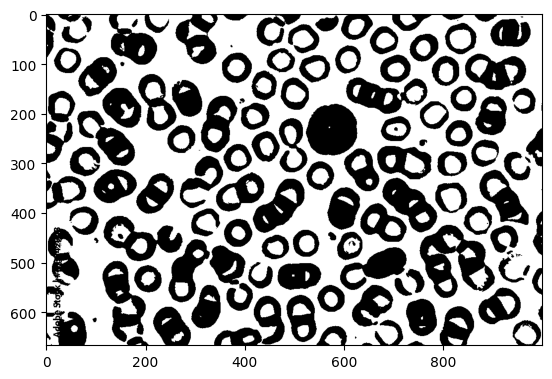

In [7]:
plt.imshow(cv2.cvtColor(binary_img, cv2.COLOR_BGR2RGB))

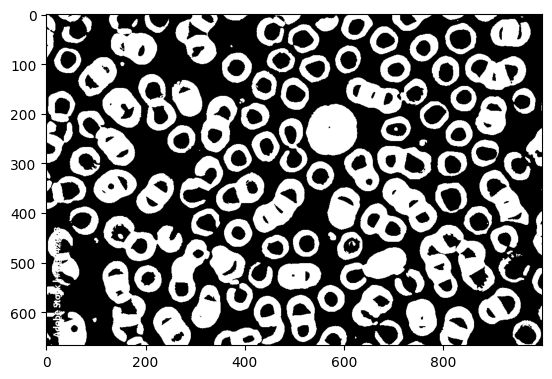

In [8]:
plt.imshow(cv2.cvtColor(inverted_binary_img, cv2.COLOR_BGR2RGB))

In [9]:
# Detect contours
# hierarchy variable contains information about the relationship between each contours
contours_list, hierarchy = cv2.findContours(inverted_binary_img,
                                       cv2.RETR_TREE,
                                       cv2.CHAIN_APPROX_SIMPLE) # Find contours

# Draw first contour
first_contour = 0
second_contour = 1

contour1 = cv2.drawContours(input_image, contours_list, first_contour,(255,0,255),3)
#cv2.imshow('First detected contour', contour1)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [12]:
# Draw a bounding box around the first contour
x, y, w, h = cv2.boundingRect(contours_list[first_contour])
cv2.rectangle(contour1,(x,y), (x+w,y+h), (0,0,255), 5)
#cv2.imshow('First contour with bounding box', contour1)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [25]:
# Draw a bounding box around all detected contours
for c in contours_list:
    x, y, w, h = cv2.boundingRect(c)

    # Make sure contour area is large enough
    if (cv2.contourArea(c)) > 1000:
        cv2.rectangle(input_image_cpy, (x, y), (x + w, y + h), (0, 0, 255), 5)

#cv2.imshow('All contours with bounding box', input_image_cpy)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

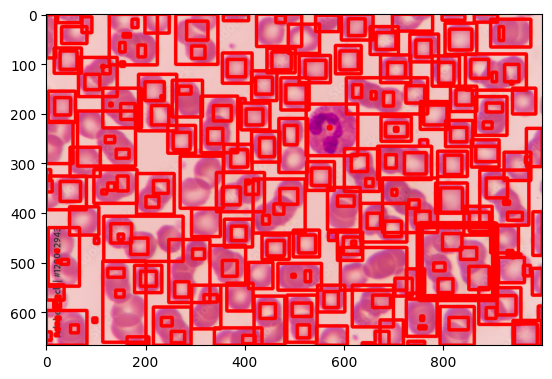

In [26]:
plt.imshow(cv2.cvtColor(input_image_cpy, cv2.COLOR_BGR2RGB))

In [7]:
import cv2 
import numpy as np 
  
# Let's load a simple image with 3 black squares 
image = cv2.imread('Images/blood1.jpg') 
cv2.waitKey(0) 
  
# Grayscale 
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
  
# Find Canny edges 
edged = cv2.Canny(gray, 30, 140) 
cv2.waitKey(0) 
  
# Finding Contours 
# Use a copy of the image e.g. edged.copy() 
# since findContours alters the image 
contours, hierarchy = cv2.findContours(edged,  
    cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
  
cv2.imshow('Canny Edges After Contouring', edged) 
cv2.waitKey(0) 
  
print("Number of Contours found = " + str(len(contours))) 
  
# Draw all contours 
# -1 signifies drawing all contours 
cv2.drawContours(image, contours, -1, (0, 255, 0), 3) 
  
cv2.imshow('Contours', image) 
cv2.waitKey(0) 
cv2.destroyAllWindows() 

Number of Contours found = 254


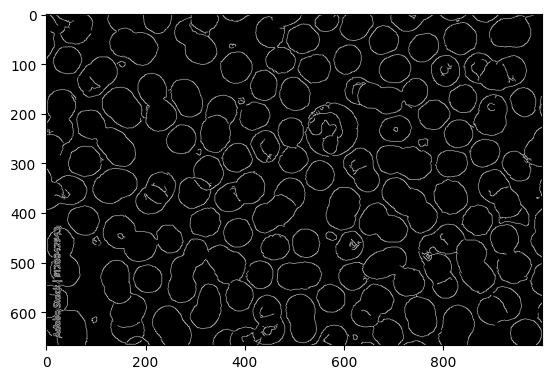

In [8]:
plt.imshow(cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))

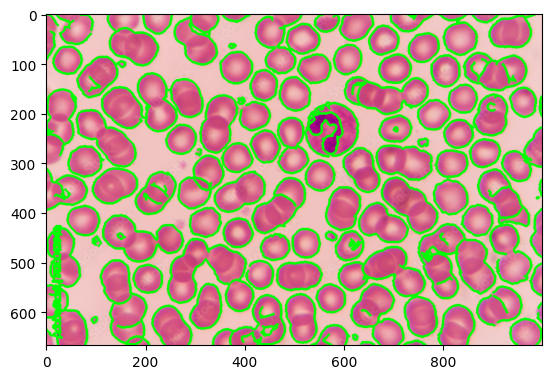

In [9]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))